<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Optimization" data-toc-modified-id="Optimization-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Optimization</a></span><ul class="toc-item"><li><span><a href="#Setup" data-toc-modified-id="Setup-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Setup</a></span></li><li><span><a href="#Single-Task-Optimization-A" data-toc-modified-id="Single-Task-Optimization-A-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Single Task Optimization A</a></span><ul class="toc-item"><li><span><a href="#Generate-Suggestions" data-toc-modified-id="Generate-Suggestions-1.2.1"><span class="toc-item-num">1.2.1&nbsp;&nbsp;</span>Generate Suggestions</a></span></li></ul></li><li><span><a href="#Multitask-Experiments-B" data-toc-modified-id="Multitask-Experiments-B-1.3"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>Multitask Experiments B</a></span><ul class="toc-item"><li><span><a href="#Generate-Suggestions" data-toc-modified-id="Generate-Suggestions-1.3.1"><span class="toc-item-num">1.3.1&nbsp;&nbsp;</span>Generate Suggestions</a></span></li><li><span><a href="#Test-STBO" data-toc-modified-id="Test-STBO-1.3.2"><span class="toc-item-num">1.3.2&nbsp;&nbsp;</span>Test STBO</a></span></li></ul></li><li><span><a href="#LCM-Kernel" data-toc-modified-id="LCM-Kernel-1.4"><span class="toc-item-num">1.4&nbsp;&nbsp;</span>LCM Kernel</a></span></li></ul></li><li><span><a href="#Weighted-MTBO" data-toc-modified-id="Weighted-MTBO-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Weighted MTBO</a></span></li></ul></div>

# Optimization

From the menu above, select "Runtime" -> "Run All".

If you've already run this noteboook recently, click on "Single Task Optimization", then click "Runtime" -> "Run After."

## Setup

In [10]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [11]:
from summit import *
from summit.strategies.random import _lhscentered
from multitask import *
import pandas as pd
import torch
import gpytorch
import hiplot as hip
import numpy as np
import matplotlib.pyplot as plt

from botorch.models import MultiTaskGP, SingleTaskGP
from botorch.fit import fit_gpytorch_model
from botorch.optim import optimize_acqf, optimize_acqf_mixed
from gpytorch.mlls.exact_marginal_log_likelihood import (
    ExactMarginalLogLikelihood,
)

## Single Task Optimization A

Import data

In [3]:
df = pd.read_csv("../data/experiments/ch_activation_experiments_a.csv", skiprows=1)

In [31]:
num_experiments = 1

### Generate Suggestions

In [32]:
# Transform data
categorical_columns = ["Solvent", "Ligand"]
for col in categorical_columns:
    df[col] = df[col].str.split(r" \(\d\)", expand=True)[0]
for col in df.columns:
    if "Unnamed" in col:
        df = df.drop(col, axis=1)
df = df.rename(columns={"ResT /min": "ResT", "Temp /°C": "Temp", "Mol%": "Mol", "Yield /%": "yld"} )
ds  = DataSet.from_df(df)
ds

,Data file,Type,Solvent,Ligand,ResT,Temp,Mol,yld,SM area,Product area,...,Volume /mL,Conc SM /M,Mol% catalyst,SM /g,Pd(OAc)2 /g,Ligand Mr,Ligand /g,NEt3 /mL,Biphenyl /g,Biphenyl /M
0,TrainingData001,Training,DMSO,DPEPhos,60,140,10,46.09,NaN,3591526.0,...,5.0,0.1,10.0,0.1008,0.0112,538.5,0.05385,0.104545,0.031,0.04026
1,TrainingData002,Training,DMSO,JohnPhos,45,70,3,1.31,2704169.0,260938.0,...,5.0,0.1,3.0,0.1008,0.00336,298.4,0.008952,0.104545,0.0263,0.034156
2,TrainingData003,Training,Toluene,DPEPhos,42,61,8,0.0,NaN,NaN,...,5.0,0.1,8.0,0.1008,0.00896,538.5,0.04308,0.104545,0.0245,0.031818
3,TrainingData004,Training,DMA,JohnPhos,9,135,5,37.91,1333228.0,4837572.0,...,5.0,0.1,5.0,0.1008,0.0056,298.4,0.01492,0.104545,0.0276,0.035844
4,TrainingData005,Training,MeCN,JohnPhos,11,134,2,16.87,1614954.0,2408002.0,...,5.0,0.1,2.0,0.1008,0.00224,298.4,0.005968,0.104545,0.0265,0.034416
5,TrainingData006,Training,MeCN,JohnPhos,19,80,5,69.7,723374.0,16037972.0,...,5.0,0.1,5.0,0.1008,0.0056,298.4,0.01492,0.104545,0.026,0.033766
6,TrainingData007,Training,NMP,JohnPhos,47,143,4,40.92,NaN,7980309.0,...,5.0,0.1,4.0,0.1008,0.00448,298.4,0.011936,0.104545,0.0302,0.039221
7,TrainingData008,Training,DMSO,SPhos,29,122,4,0.0,1001820.0,0.0,...,5.0,0.1,4.0,0.1008,0.00448,410.5,0.01642,0.104545,0.027,0.035065
8,TrainingData009,Training,NMP,Xphos,52,112,8,55.69,647744.0,10707780.0,...,5.0,0.1,8.0,0.1008,0.00896,476.7,0.038136,0.104545,0.028,0.036364
9,NaN,Training,NMP,DPEPhos,26,53,6,0.0,NaN,NaN,...,5.0,0.1,6.0,0.1008,0.00672,NaN,0.0,0.104545,NaN,0.0


In [33]:
# Create domain
domain = Domain()

# Solvents: Toluene (1), DMA (2), MeCN (3), DMSO (4), NMP (5)
# Ligand: JohnPhos (1), Sphos (2), Xphos (3), DPEPhos (4)
# ResT: 5 - 60 mins
# Temp: 50 - 150 deg
# Mol%: 2 - 10 %
domain += CategoricalVariable(
    "Solvent",
    "Solvent used for the reaction", 
    levels=["Toluene", "DMA", "MeCN", "DMSO", "NMP"]
)
domain += CategoricalVariable(
    "Ligand",
    "Ligand used for the reaction",
    levels=["JohnPhos", "SPhos", "Xphos", "DPEPhos"]
)
domain += ContinuousVariable(
    "ResT",
    "Residence Time (minutes)",
    bounds=(5, 60)
)
domain += ContinuousVariable(
    "Temp",
    "Reaction temperature in deg C",
    bounds=(50,150)
)
domain += ContinuousVariable(
    "Mol",
    "Catalyst mol percent",
    bounds=(2,10)
)
domain += ContinuousVariable(
    "yld",
    "Reaction yield",
    bounds=(0, 100),
    is_objective=True,
    maximize=True
)
print("Domain")
domain

Domain


Name,Type,Description,Values
Solvent,"categorical, input",Solvent used for the reaction,5 levels
Ligand,"categorical, input",Ligand used for the reaction,4 levels
ResT,"continuous, input",Residence Time (minutes),"[5,60]"
Temp,"continuous, input",Reaction temperature in deg C,"[50,150]"
Mol,"continuous, input",Catalyst mol percent,"[2,10]"
yld,"continuous, maximize objective",Reaction yield,"[0,100]"


In [34]:
cat_mappings = {}
cat_dimensions = []
for i, v in enumerate(domain.input_variables):
    if v.variable_type == "categorical":
        cat_mapping = {l: i for i, l in enumerate(v.levels)}
        cat_mappings[v.name] = cat_mapping
        cat_dimensions.append(i)

In [35]:
combos = domain.get_categorical_combinations()
for v in domain.input_variables:
    if v.variable_type == "categorical":
        combos[v.name] = combos[v.name].replace(cat_mappings[v.name])

In [36]:
strategy = NewSTBO(domain, acquisition_function="qNEI", categorical_method=None, brute_force_categorical=True)
suggestions = strategy.suggest_experiments(int(num_experiments), prev_res=ds)
suggestions = suggestions.round(0)
suggestions

,Solvent,Ligand,ResT,Temp,Mol,strategy
0,MeCN,JohnPhos,57.0,80.0,9.0,STBO


In [37]:
from botorch.optim import optimize_acqf, optimize_acqf_mixed
inputs, output = strategy.transform.transform_inputs_outputs(
    ds,
    categorical_method=None,
    # standardize_inputs=True,
    min_max_scale_inputs=True,
    min_max_scale_outputs=True
    # standardize_outputs=True,
)
cat_mappings = {}
cat_dimensions = []
for i, v in enumerate(strategy.domain.input_variables):
    if v.variable_type == "categorical":
        cat_mapping = {l: i for i, l in enumerate(v.levels)}
        inputs[v.name] = inputs[v.name].replace(cat_mapping)
        cat_mappings[v.name] = cat_mapping
        cat_dimensions.append(i)
fixed_features_list = []
for k, combo in combos.iterrows():
    fixed_features_list.append(
        {dim: combo[i] for i, dim in enumerate(cat_dimensions)}
    )

ff_candidate_list, ff_acq_value_list = [], []
for fixed_features in fixed_features_list:
    candidate, acq_value = optimize_acqf(
        acq_function=strategy.acq,
        bounds=strategy._get_bounds(),
        q=1,
        num_restarts=100,
        raw_samples=2000,
        fixed_features=fixed_features,
        return_best_only=False,
    )
    ff_candidate_list.append(candidate)
    ff_acq_value_list.append(acq_value)
    
ff_candidate_list = torch.cat(ff_candidate_list)
# ff_acq_values = torch.stack(ff_acq_value_list)
X = pd.DataFrame(
    ff_candidate_list.squeeze().numpy(), 
    columns=[v.name for v in strategy.domain.input_variables]
)
X = DataSet.from_df(X)


for i, v in enumerate(strategy.domain.input_variables):
    if v.variable_type == "categorical":
        cat_mapping = {i: l for i, l in enumerate(v.levels)}
        X[v.name] = X[v.name].replace(cat_mapping)

X = strategy.transform.un_transform(
    X,
    categorical_method=None,
    min_max_scale_inputs=True,
    min_max_scale_outputs=True,
)
X = pd.DataFrame(
    X.values,
    columns=[v.name for v in strategy.domain.input_variables]
)
with torch.no_grad():
    acq = strategy.acq(ff_candidate_list)
X["acq"] = acq

with torch.no_grad():
    posterior = strategy.model.posterior(ff_candidate_list)
    samples = [posterior.sample() for i in range(100)]

samples = torch.stack(samples).squeeze()
avg = samples.mean(axis=0)
std = samples.std(axis=0)

X["y_mean"] = avg
X["y_std"] = std

In [38]:
import hiplot as hip
hexp = hip.Experiment.from_dataframe(X.sort_values("acq", ascending=False))
hexp.display_data(hip.Displays.PARALLEL_PLOT).update({"hide":["uid"]})
hexp.display()

<IPython.core.display.Javascript object>

In [39]:
strategy = NewSTBO(domain)
suggestions = strategy.suggest_experiments(int(num_experiments), prev_res=ds)
suggestions = suggestions.round(0)
suggestions

/Users/dsw46/opt/anaconda3/envs/dswigh_default/lib/python3.9/site-packages/summit/strategies/base.py:162: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  new_ds = new_ds.drop(variable.name, axis=1)
/Users/dsw46/opt/anaconda3/envs/dswigh_default/lib/python3.9/site-packages/summit/strategies/base.py:162: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  new_ds = new_ds.drop(variable.name, axis=1)
/Users/dsw46/opt/anaconda3/envs/dswigh_default/lib/python3.9/site-packages/summit/strategies/base.py:334: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  new_ds = new_ds.drop(one_hot_names, axis=1)
/Users/dsw46/opt/anaconda3/envs/dswigh_default/lib/python3.9/site-packages/summit/strategies/base.py:334: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance

,ResT,Temp,Mol,Solvent,Ligand,strategy
0,60.0,83.0,9.0,NMP,Xphos,STBO


In [40]:
from botorch.optim import optimize_acqf, optimize_acqf_mixed
inputs, output = strategy.transform.transform_inputs_outputs(
    ds,
    categorical_method="one-hot",
    # standardize_inputs=True,
    min_max_scale_inputs=True,
    min_max_scale_outputs=True
    # standardize_outputs=True,
)
candidates, acq_values= optimize_acqf(
    acq_function=strategy.acq,
    bounds=strategy._get_bounds(),
    num_restarts=100,
    q=1,
    raw_samples=2000,
    return_best_only=False
)

res = DataSet(candidates.squeeze(), columns=inputs.data_columns)
X = strategy.transform.un_transform(
    res,
    categorical_method="one-hot",
    min_max_scale_inputs=True,
    min_max_scale_outputs=True,
)

X = pd.DataFrame(
    X.values,
    columns=X.data_columns
)
with torch.no_grad():
    acq = strategy.acq(candidates)
X["acq"] = acq

with torch.no_grad():
    posterior = strategy.model.posterior(candidates)
    samples = [posterior.sample() for i in range(100)]

samples = torch.stack(samples).squeeze()
avg = samples.mean(axis=0)
std = samples.std(axis=0)

X["y_mean"] = avg
X["y_std"] = std

/Users/dsw46/opt/anaconda3/envs/dswigh_default/lib/python3.9/site-packages/summit/strategies/base.py:162: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  new_ds = new_ds.drop(variable.name, axis=1)
/Users/dsw46/opt/anaconda3/envs/dswigh_default/lib/python3.9/site-packages/summit/strategies/base.py:162: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  new_ds = new_ds.drop(variable.name, axis=1)
/Users/dsw46/opt/anaconda3/envs/dswigh_default/lib/python3.9/site-packages/summit/strategies/base.py:334: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  new_ds = new_ds.drop(one_hot_names, axis=1)
/Users/dsw46/opt/anaconda3/envs/dswigh_default/lib/python3.9/site-packages/summit/strategies/base.py:334: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance

In [41]:
import hiplot as hip
hexp = hip.Experiment.from_dataframe(X.sort_values("acq", ascending=False))
hexp.display_data(hip.Displays.PARALLEL_PLOT).update({"hide":["uid"]})
hexp.display()

<IPython.core.display.Javascript object>

In [42]:
strategy.model.covar_module.base_kernel.lengthscale

tensor([[0.3344, 0.3346, 0.3328, 0.3313, 0.3313, 0.3340, 0.3347, 0.3339, 0.3321,
         0.3596, 0.3410, 0.3233]], dtype=torch.float64,
       grad_fn=<SoftplusBackward0>)

## Multitask Experiments B

In [16]:
df_a = pd.read_csv("../data/experiments/ch_activation_experiments_a.csv", skiprows=1)
df_b = pd.read_csv("../data/experiments/ch_activation_experiments_b.csv", skiprows=1)

In [17]:
num_experiments = 1

### Setup Domain

In [18]:
# Transform data
def transform_data(df):
    categorical_columns = ["Solvent", "Ligand"]
    for col in categorical_columns:
        df[col] = df[col].str.split(r" \(\d\)", expand=True)[0]
    for col in df.columns:
        if "Unnamed" in col:
            df = df.drop(col, axis=1)
    df = df.rename(columns={"ResT /min": "ResT", "Temp /°C": "Temp", "Mol%": "Mol", "Yield /%": "yld"} )
    ds  = DataSet.from_df(df)
    return ds

ds_a = transform_data(df_a)
ds_b = transform_data(df_b)
ds_a[("task", "METADATA")] = 0
ds_b[("task", "METADATA")] = 1

In [19]:
# Create domain
domain = Domain()

# Solvents: Toluene (1), DMA (2), MeCN (3), DMSO (4), NMP (5)
# Ligand: JohnPhos (1), Sphos (2), Xphos (3), DPEPhos (4)
# ResT: 5 - 60 mins
# Temp: 50 - 150 deg
# Mol%: 2 - 10 %
domain += CategoricalVariable(
    "Solvent",
    "Solvent used for the reaction", 
    levels=["Toluene", "DMA", "MeCN", "DMSO", "NMP"]
)
domain += CategoricalVariable(
    "Ligand",
    "Ligand used for the reaction",
    levels=["JohnPhos", "SPhos", "Xphos", "DPEPhos"]
)
domain += ContinuousVariable(
    "ResT",
    "Residence Time (minutes)",
    bounds=(5, 60)
)
domain += ContinuousVariable(
    "Temp",
    "Reaction temperature in deg C",
    bounds=(50,150)
)
domain += ContinuousVariable(
    "Mol",
    "Catalyst mol percent",
    bounds=(2,10)
)
domain += ContinuousVariable(
    "yld",
    "Reaction yield",
    bounds=(0, 100),
    is_objective=True,
    maximize=True
)
print("Domain")
domain

Domain


Name,Type,Description,Values
Solvent,"categorical, input",Solvent used for the reaction,5 levels
Ligand,"categorical, input",Ligand used for the reaction,4 levels
ResT,"continuous, input",Residence Time (minutes),"[5,60]"
Temp,"continuous, input",Reaction temperature in deg C,"[50,150]"
Mol,"continuous, input",Catalyst mol percent,"[2,10]"
yld,"continuous, maximize objective",Reaction yield,"[0,100]"


### Generate Suggestions

In [20]:
strategy = NewMTBO(
    domain,
    pretraining_data=ds_a, 
    acquisition_function="qNEI",
    brute_force_categorical=False,
#     model_type=NewMTBO.LCM,
)

# tempor
suggestions = strategy.suggest_experiments(int(num_experiments), ds_b.drop(7))
suggestions = suggestions.round(0)
suggestions

/Users/Kobi/Documents/Research/phd_code/multitask/multitask/mt.py:176: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data = self.all_experiments.append(self.pretraining_data)
/Users/Kobi/Library/Caches/pypoetry/virtualenvs/multitask-k0YbXS9f-py3.9/lib/python3.9/site-packages/summit/strategies/base.py:162: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  new_ds = new_ds.drop(variable.name, axis=1)
/Users/Kobi/Library/Caches/pypoetry/virtualenvs/multitask-k0YbXS9f-py3.9/lib/python3.9/site-packages/summit/strategies/base.py:162: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  new_ds = new_ds.drop(variable.name, axis=1)
/Users/Kobi/Library/Caches/pypoetry/virtualenvs/multitask-k0YbXS9f-py3.9/lib/python3.9/site-packages/summit/strategies/base.py:334: PerformanceWarning: dropping

,ResT,Temp,Mol,Solvent,Ligand,strategy,task
0,26.0,104.0,5.0,MeCN,JohnPhos,MTBO,1


In [116]:
def get_dists(candidate, existing):
    m, n = existing.shape
    d = []
    for i in range(m):
        d.append((sum((candidate - existing[i, :]) ** 2)) ** 0.5)
    return d

In [143]:
inputs, output = strategy.transform.transform_inputs_outputs(
    ds_a.append(ds_b.iloc[:7]),
    categorical_method="one-hot",
    min_max_scale_inputs=True,
    min_max_scale_outputs=True
)
continuous_variables = [v.name for v in domain.input_variables if v.variable_type == "continuous"]
categorical_variables = [v.name for v in domain.input_variables if v.variable_type == "categorical"]
maxdist = 0
existing = inputs[continuous_variables].to_numpy()
ncont = len(continuous_variables)
lhs = _lhscentered(ncont, ncont*1000, np.random.RandomState())
for sample in lhs:
    dists = get_dists(existing, lhs)
    if maxdist < np.min(dists):
        maxdist = np.min(dists)
        H = sample
for i, v in enumerate(continuous_variables):
    bounds = domain[v].bounds
    H[i] = H[i]*(bounds[1]-bounds[0])+bounds[0]
cat_max = ds_b.iloc[:7].groupby(categorical_variables)["yld"].max().sort_values(ascending=False).index[0]
X = np.hstack([np.array(cat_max), H])
df =pd.DataFrame(np.atleast_2d(X), columns=categorical_variables+continuous_variables)
for v in continuous_variables:
    df[v] = df[v].astype(float)
df.round(0)

<ipython-input-143-669d862f2318>:2: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ds_a.append(ds_b.iloc[:7]),
/Users/Kobi/Library/Caches/pypoetry/virtualenvs/multitask-k0YbXS9f-py3.9/lib/python3.9/site-packages/summit/strategies/base.py:162: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  new_ds = new_ds.drop(variable.name, axis=1)
/Users/Kobi/Library/Caches/pypoetry/virtualenvs/multitask-k0YbXS9f-py3.9/lib/python3.9/site-packages/summit/strategies/base.py:162: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  new_ds = new_ds.drop(variable.name, axis=1)


,Solvent,Ligand,ResT,Temp,Mol
0,MeCN,JohnPhos,15.0,141.0,6.0


,Solvent,Ligand,ResT,Temp,Mol
0,MeCN,JohnPhos,20.0,79.0,7.0


('MeCN', 'JohnPhos')

In [77]:
from botorch.optim import optimize_acqf
from botorch.acquisition.acquisition import AcquisitionFunction
from torch import Tensor
from typing import List, Dict, Optional, Callable, Any

def optimize_acqf_mixed(
    acq_function: AcquisitionFunction,
    bounds: Tensor,
    q: int,
    num_restarts: int,
    fixed_features_list: List[Dict[int, float]],
    raw_samples: Optional[int] = None,
    options: Optional[Dict[str, Union[bool, float, int, str]]] = None,
    inequality_constraints: Optional[List[Tuple[Tensor, Tensor, float]]] = None,
    equality_constraints: Optional[List[Tuple[Tensor, Tensor, float]]] = None,
    post_processing_func: Optional[Callable[[Tensor], Tensor]] = None,
    batch_initial_conditions: Optional[Tensor] = None,
    **kwargs: Any,
) -> Tuple[Tensor, Tensor]:
    if q == 1:
        ff_candidate_list, ff_acq_value_list = [], []
        for fixed_features in fixed_features_list:
            candidate, acq_value = optimize_acqf(
                acq_function=acq_function,
                bounds=bounds,
                q=q,
                num_restarts=num_restarts,
                raw_samples=raw_samples,
                options=options or {},
                inequality_constraints=inequality_constraints,
                equality_constraints=equality_constraints,
                fixed_features=fixed_features,
                post_processing_func=post_processing_func,
                batch_initial_conditions=batch_initial_conditions,
                return_best_only=False,
            )
            ff_candidate_list.append(candidate)
            ff_acq_value_list.append(acq_value)

        ff_acq_values = torch.cat(ff_acq_value_list)
        best = torch.argmax(ff_acq_values)
        return ff_candidate_list, ff_acq_values


In [9]:
# from botorch.optim import optimize_acqf, optimize_acqf_mixed
inputs, output = strategy.transform.transform_inputs_outputs(
    ds_a.append(ds_b),
    categorical_method="one-hot",
    min_max_scale_inputs=True,
    min_max_scale_outputs=True
)
fixed_features_list = strategy._get_fixed_features()
candidates, acq_values= optimize_acqf_mixed(
    acq_function=strategy.acq,
    bounds=strategy._get_bounds(),
    fixed_features_list=fixed_features_list,
    num_restarts=100,
    q=1,
    raw_samples=2000,
    return_best_only=False
)


<ipython-input-9-8aa00d357377>:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ds_a.append(ds_b),
/Users/Kobi/Library/Caches/pypoetry/virtualenvs/multitask-k0YbXS9f-py3.9/lib/python3.9/site-packages/summit/strategies/base.py:162: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  new_ds = new_ds.drop(variable.name, axis=1)
/Users/Kobi/Library/Caches/pypoetry/virtualenvs/multitask-k0YbXS9f-py3.9/lib/python3.9/site-packages/summit/strategies/base.py:162: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  new_ds = new_ds.drop(variable.name, axis=1)
/Users/Kobi/Library/Caches/pypoetry/virtualenvs/multitask-k0YbXS9f-py3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: 

In [10]:
candidates_stacked = torch.cat([c.squeeze() for c in candidates])

In [11]:
res = DataSet(candidates_stacked, columns=inputs.data_columns)
X = strategy.transform.un_transform(
    res,
    categorical_method="one-hot",
    min_max_scale_inputs=True,
    min_max_scale_outputs=True
)

X = pd.DataFrame(
    X.values,
    columns=X.data_columns
)
# with torch.no_grad():
#     acq = strategy.acq(candidates)
X["acq"] = acq_values

with torch.no_grad():
    posterior = strategy.model.posterior(candidates_stacked)
    samples = [posterior.sample() for i in range(100)]

samples = torch.stack(samples).squeeze()
avg = samples.mean(axis=0)
std = samples.std(axis=0)

X["y_mean"] = avg
X["y_std"] = std

/Users/Kobi/Library/Caches/pypoetry/virtualenvs/multitask-k0YbXS9f-py3.9/lib/python3.9/site-packages/summit/strategies/base.py:334: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  new_ds = new_ds.drop(one_hot_names, axis=1)
/Users/Kobi/Library/Caches/pypoetry/virtualenvs/multitask-k0YbXS9f-py3.9/lib/python3.9/site-packages/summit/strategies/base.py:334: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  new_ds = new_ds.drop(one_hot_names, axis=1)
/Users/Kobi/Library/Caches/pypoetry/virtualenvs/multitask-k0YbXS9f-py3.9/lib/python3.9/site-packages/gpytorch/utils/cholesky.py:38: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(


In [12]:
hexp = hip.Experiment.from_dataframe(X.sort_values("acq", ascending=False))
hexp.display_data(hip.Displays.PARALLEL_PLOT).update({"hide":["uid"]})
hexp.display()

<IPython.core.display.Javascript object>

In [13]:
strategy.model.covar_module.base_kernel.lengthscale

tensor([[0.3351, 0.3351, 0.3325, 0.3310, 0.3306, 0.3337, 0.3353, 0.3337, 0.3321,
         0.4465, 0.2704, 0.4563]], dtype=torch.float64,
       grad_fn=<SoftplusBackward0>)

### Test STBO

In [59]:
strategy = NewSTBO(
    domain,
    acquisition_function="EI",
    brute_force_categorical=True,
    categorical_method="one-hot"
)

suggestions = strategy.suggest_experiments(int(num_experiments), prev_res=ds_b.drop(7))
suggestions = suggestions.round(0)
suggestions

/Users/Kobi/Library/Caches/pypoetry/virtualenvs/multitask-k0YbXS9f-py3.9/lib/python3.9/site-packages/summit/strategies/base.py:162: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  new_ds = new_ds.drop(variable.name, axis=1)
/Users/Kobi/Library/Caches/pypoetry/virtualenvs/multitask-k0YbXS9f-py3.9/lib/python3.9/site-packages/summit/strategies/base.py:162: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  new_ds = new_ds.drop(variable.name, axis=1)
/Users/Kobi/Library/Caches/pypoetry/virtualenvs/multitask-k0YbXS9f-py3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/Users/Kobi/Library/Caches/pypoetry/virtualenvs/multitask-k0YbXS9f-py3.9/lib/python3.9/site-packages/sklearn/utils/validation.py

,ResT,Temp,Mol,Solvent,Ligand,strategy
0,25.0,94.0,3.0,MeCN,JohnPhos,STBO


<ipython-input-72-07f577111ef0>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data = ds_a.append(ds_b)
/Users/Kobi/Library/Caches/pypoetry/virtualenvs/multitask-k0YbXS9f-py3.9/lib/python3.9/site-packages/summit/strategies/base.py:162: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  new_ds = new_ds.drop(variable.name, axis=1)
/Users/Kobi/Library/Caches/pypoetry/virtualenvs/multitask-k0YbXS9f-py3.9/lib/python3.9/site-packages/summit/strategies/base.py:162: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  new_ds = new_ds.drop(variable.name, axis=1)


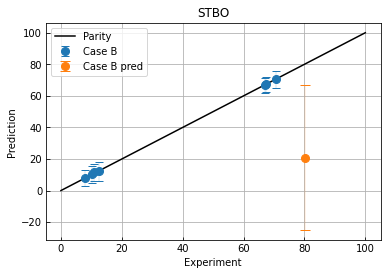

In [72]:
data = ds_a.append(ds_b)
inputs, output = strategy.transform.transform_inputs_outputs(
    data,
    categorical_method="one-hot",
    min_max_scale_inputs=True,
    min_max_scale_outputs=True
)

with torch.no_grad():
    posterior = strategy.model.posterior(
        torch.tensor(inputs.data_to_numpy().astype(float)).double()
    )
    samples = [posterior.sample() for i in range(100)]
samples = torch.stack(samples).squeeze()
samples_mean = samples.mean(axis=0) *100
samples_std = samples.std(axis=0) * 100



fig, ax = plt.subplots(1, figsize=(6,4))
# ax.errorbar(
#     data["yld"].iloc[:23],
#     samples_mean[:23],
#     yerr=1.96*samples_std[:23],
#     label = "Case A",
#     linewidth=0,
#     marker="o",
#     markersize=8,
#     elinewidth=0.2,
#     capsize=4.0
# )
ax.errorbar(
    data["yld"].iloc[23:-1],
    samples_mean[23:-1],
    yerr=1.96*samples_std[23:-1],
    label = "Case B",
    linewidth=0,
    marker="o",
    markersize=8,
    elinewidth=0.2,
    capsize=4.0
)
ax.grid()
ax.errorbar(
    data["yld"].iloc[-1],
    samples_mean[-1],
    yerr=1.96*samples_std[-1],
    label = "Case B pred",
    linewidth=0,
    marker="o",
    markersize=8,
    elinewidth=0.2,
    capsize=5.0
)
# ax.scatter(data["yld"].iloc[23:], samples_mean[23:], label = "Task B", c="orange")
ax.plot([0,100],[0,100], label="Parity", c="black")
ax.set_xlabel("Experiment")
ax.set_ylabel("Prediction")
ax.tick_params(direction="in")
ax.set_title("STBO")
ax.legend()
fig.savefig("../figures/ch_activation_b_STBO_predict.png", dpi=300)

In [ ]:
from botorch.optim import optimize_acqf
from botorch.acquisition.acquisition import AcquisitionFunction
from torch import Tensor
from typing import List, Dict, Optional, Callable, Any

def optimize_acqf_mixed(
    acq_function: AcquisitionFunction,
    bounds: Tensor,
    q: int,
    num_restarts: int,
    fixed_features_list: List[Dict[int, float]],
    raw_samples: Optional[int] = None,
    options: Optional[Dict[str, Union[bool, float, int, str]]] = None,
    inequality_constraints: Optional[List[Tuple[Tensor, Tensor, float]]] = None,
    equality_constraints: Optional[List[Tuple[Tensor, Tensor, float]]] = None,
    post_processing_func: Optional[Callable[[Tensor], Tensor]] = None,
    batch_initial_conditions: Optional[Tensor] = None,
    **kwargs: Any,
) -> Tuple[Tensor, Tensor]:
    if q == 1:
        ff_candidate_list, ff_acq_value_list = [], []
        for fixed_features in fixed_features_list:
            candidate, acq_value = optimize_acqf(
                acq_function=acq_function,
                bounds=bounds,
                q=q,
                num_restarts=num_restarts,
                raw_samples=raw_samples,
                options=options or {},
                inequality_constraints=inequality_constraints,
                equality_constraints=equality_constraints,
                fixed_features=fixed_features,
                post_processing_func=post_processing_func,
                batch_initial_conditions=batch_initial_conditions,
                return_best_only=False,
            )
            ff_candidate_list.append(candidate)
            ff_acq_value_list.append(acq_value)

        ff_acq_values = torch.cat(ff_acq_value_list)
        best = torch.argmax(ff_acq_values)
        return ff_candidate_list, ff_acq_values

In [ ]:
# from botorch.optim import optimize_acqf, optimize_acqf_mixed
inputs, output = strategy.transform.transform_inputs_outputs(
    ds_b,
    categorical_method="one-hot",
    min_max_scale_inputs=True,
    min_max_scale_outputs=True
)
fixed_features_list = strategy._get_fixed_features()
candidates, acq_values= optimize_acqf_mixed(
    acq_function=strategy.acq,
    bounds=strategy._get_bounds(),
    fixed_features_list=fixed_features_list,
    num_restarts=100,
    q=1,
    raw_samples=2000,
    return_best_only=False
)

In [ ]:
candidates_stacked = torch.cat([c.squeeze() for c in candidates])

In [ ]:
res = DataSet(candidates_stacked, columns=inputs.data_columns)
X = strategy.transform.un_transform(
    res,
    categorical_method="one-hot",
    min_max_scale_inputs=True,
    min_max_scale_outputs=True
)

X = pd.DataFrame(
    X.values,
    columns=X.data_columns
)
X["acq"] = acq_values

with torch.no_grad():
    posterior = strategy.model.posterior(candidates_stacked)
    samples = [posterior.sample() for i in range(100)]

samples = torch.stack(samples).squeeze()
avg = samples.mean(axis=0)
std = samples.std(axis=0)

X["y_mean"] = avg
X["y_std"] = std

In [ ]:
hexp = hip.Experiment.from_dataframe(X.sort_values("acq", ascending=False))
hexp.display_data(hip.Displays.PARALLEL_PLOT).update({"hide":["uid"]})
hexp.display()

### Test Neural Network 

In [ ]:
from summit.benchmarks import ExperimentalEmulator
import torch.nn.functional as F

In [ ]:
class ANNRegressorSmall(torch.nn.Module):
    """Artificial Neural Network Regressor
    Parameters
    -----------
    input_dim : int
        The number of features in the input
    output_dim : int
        The number of outputs in the targets
    hidden_units : int, optional
        The number of hidden units. Default is 512.
    """

    def __init__(self, input_dim, output_dim, hidden_units=16, **kwargs):
        super().__init__()

        self.num_hidden_layers = 1
        self.input_layer = torch.nn.Linear(input_dim, hidden_units)
        self.output_layer = torch.nn.Linear(hidden_units, output_dim)

    def forward(self, x, **kwargs):
        x_ = F.relu(self.input_layer(x))
        if self.num_hidden_layers > 1:
            x_ = self.hidden_layers(x_)
            x_ = F.relu(x_)
        return self.output_layer(x_)

In [ ]:
emul = ExperimentalEmulator("ch_case_b", domain, dataset=ds_b, regressor=ANNRegressorSmall)
# params = { "regressor__net__hidden_units": [64, 128, 256, 512]}
emul.train()

In [ ]:
emul.parity_plot()

### Weighted MTBO

In [73]:
strategy = NewMTBO(
    domain,
    pretraining_data=ds_a, 
    model=NewMTBO.ICM,
    acquisition_function="WeightedEI",
    brute_force_categorical=True,
)

suggestions = strategy.suggest_experiments(int(num_experiments), prev_res=ds_b.iloc[:7])
suggestions = suggestions.round(0)
suggestions

/Users/Kobi/Documents/Research/phd_code/multitask/multitask/mt.py:176: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data = self.all_experiments.append(self.pretraining_data)
/Users/Kobi/Library/Caches/pypoetry/virtualenvs/multitask-k0YbXS9f-py3.9/lib/python3.9/site-packages/summit/strategies/base.py:162: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  new_ds = new_ds.drop(variable.name, axis=1)
/Users/Kobi/Library/Caches/pypoetry/virtualenvs/multitask-k0YbXS9f-py3.9/lib/python3.9/site-packages/summit/strategies/base.py:162: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  new_ds = new_ds.drop(variable.name, axis=1)
/Users/Kobi/Library/Caches/pypoetry/virtualenvs/multitask-k0YbXS9f-py3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature na

,ResT,Temp,Mol,Solvent,Ligand,strategy,task
0,25.0,81.0,4.0,MeCN,JohnPhos,MTBO,1


In [25]:
from summit.strategies.random import LHS
lhs = LHS(domain)
data = lhs.suggest_experiments(100, exclude=["Solvent", "Ligand"])
data[("Solvent", "DATA")] = "MeCN"
data[("Ligand", "DATA")] = "JohnPhos"
data[("yld", "DATA")] = 100
inputs, output = strategy.transform.transform_inputs_outputs(
    data,
    categorical_method="one-hot",
    min_max_scale_inputs=True,
    min_max_scale_outputs=True
)
with torch.no_grad():
    X = torch.tensor(inputs.data_to_numpy()).double()
    X = torch.unsqueeze(X, 1)
    acq = strategy.acq(X)

data["acq", "DATA"] = acq.numpy()
data = data.drop("yld", axis=1)
data = pd.DataFrame(data.data_to_numpy(), columns=data.data_columns)
hexp = hip.Experiment.from_dataframe(data.sort_values("acq", ascending=False))
hexp.display_data(hip.Displays.PARALLEL_PLOT).update({"hide":["uid"]})
hexp.display()

/Users/Kobi/Library/Caches/pypoetry/virtualenvs/multitask-k0YbXS9f-py3.9/lib/python3.9/site-packages/summit/strategies/base.py:162: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  new_ds = new_ds.drop(variable.name, axis=1)
/Users/Kobi/Library/Caches/pypoetry/virtualenvs/multitask-k0YbXS9f-py3.9/lib/python3.9/site-packages/summit/strategies/base.py:162: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  new_ds = new_ds.drop(variable.name, axis=1)
<ipython-input-25-4cf5ac663a93>:19: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  data = data.drop("yld", axis=1)


<IPython.core.display.Javascript object>

<ipython-input-75-0bd2d295efc6>:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data = ds_a.append(ds_b)
/Users/Kobi/Library/Caches/pypoetry/virtualenvs/multitask-k0YbXS9f-py3.9/lib/python3.9/site-packages/summit/strategies/base.py:162: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  new_ds = new_ds.drop(variable.name, axis=1)
/Users/Kobi/Library/Caches/pypoetry/virtualenvs/multitask-k0YbXS9f-py3.9/lib/python3.9/site-packages/summit/strategies/base.py:162: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  new_ds = new_ds.drop(variable.name, axis=1)
<ipython-input-75-0bd2d295efc6>:20: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifi

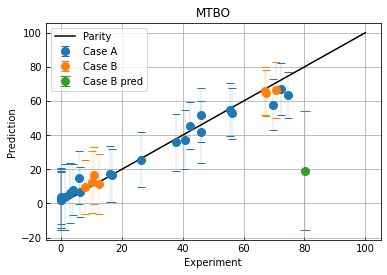

In [75]:
# Visualize model
# Doesn't include
data = ds_a.append(ds_b)
data_train = data.iloc[:-1, :]
inputs, output = strategy.transform.transform_inputs_outputs(
    data,
    categorical_method="one-hot",
    min_max_scale_inputs=True,
    min_max_scale_outputs=True
)
inputs_train = inputs.iloc[:-1,:]
output_train = output.iloc[:-1,:]

task_data = data_train["task"].dropna().to_numpy()
if task_data.shape[0] != data_train.shape[0]:
    raise ValueError("Pretraining data must have a task for every row.")
task_data = np.atleast_2d(task_data).T
inputs_task = np.append(
    inputs_train.data_to_numpy().astype(float), task_data, axis=1
).astype(np.float)

model = MultiTaskGP(
    torch.tensor(inputs_task).double(),
    torch.tensor(output_train.data_to_numpy().astype(float)).double(),
    task_feature=-1,
    # output_tasks=output_tasks,
    # task_covar_prior=prior,
)

mll = ExactMarginalLogLikelihood(model.likelihood, model)
fit_gpytorch_model(mll)

with torch.no_grad():
    posterior = model.posterior(
        torch.tensor(inputs.data_to_numpy().astype(float)).double()
    )
    samples = [posterior.sample() for i in range(100)]
    samples = torch.stack(samples).squeeze()
    samples_mean = samples.mean(axis=0) * 100
    samples_std = samples.std(axis=0) * 100

fig, ax = plt.subplots(1, figsize=(6,4))
ax.errorbar(
    data["yld"].iloc[:23],
    samples_mean[:23, 0],
    yerr=1.96*samples_std[:23, 0],
    label = "Case A",
    linewidth=0,
    marker="o",
    markersize=8,
    elinewidth=0.2,
    capsize=4.0
)
ax.errorbar(
    data["yld"].iloc[23:-1],
    samples_mean[23:-1, 1],
    yerr=1.96*samples_std[23:-1, 1],
    label = "Case B",
    linewidth=0,
    marker="o",
    markersize=8,
    elinewidth=0.2,
    capsize=4.0
)
ax.grid()
ax.errorbar(
    data["yld"].iloc[-1],
    samples_mean[-1, 1],
    yerr=1.96*samples_std[-1, 1],
    label = "Case B pred",
    linewidth=0,
    marker="o",
    markersize=8,
    elinewidth=0.2,
    capsize=5.0
)
# ax.scatter(data["yld"].iloc[23:], samples_mean[23:], label = "Task B", c="orange")
ax.plot([0,100],[0,100], label="Parity", c="black")
ax.set_xlabel("Experiment")
ax.set_ylabel("Prediction")
ax.tick_params(direction="in")
ax.set_title("MTBO")
ax.legend()
fig.savefig("../figures/ch_activation_b_MTBO_predict.png", dpi=300)

In [48]:
from summit.strategies.random import LHS
lhs = LHS(domain)
data = lhs.suggest_experiments(100, exclude=["Solvent", "Ligand"])
data[("Solvent", "DATA")] = "MeCN"
data[("Ligand", "DATA")] = "JohnPhos"
data[("yld", "DATA")] = 100
inputs, output = strategy.transform.transform_inputs_outputs(
    data,
    categorical_method="one-hot",
    min_max_scale_inputs=True,
    min_max_scale_outputs=True
)
with torch.no_grad():
    X = torch.tensor(inputs.data_to_numpy()).double()
    X = torch.unsqueeze(X, 1)
    acq = strategy.acq(X)

data["acq", "DATA"] = acq.numpy()
data = data.drop("yld", axis=1)
data = pd.DataFrame(data.data_to_numpy(), columns=data.data_columns)
hexp = hip.Experiment.from_dataframe(data.sort_values("acq", ascending=False))
hexp.display_data(hip.Displays.PARALLEL_PLOT).update({"hide":["uid"]})
hexp.display()

/Users/Kobi/Library/Caches/pypoetry/virtualenvs/multitask-k0YbXS9f-py3.9/lib/python3.9/site-packages/summit/strategies/base.py:162: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  new_ds = new_ds.drop(variable.name, axis=1)
/Users/Kobi/Library/Caches/pypoetry/virtualenvs/multitask-k0YbXS9f-py3.9/lib/python3.9/site-packages/summit/strategies/base.py:162: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  new_ds = new_ds.drop(variable.name, axis=1)
<ipython-input-48-4cf5ac663a93>:19: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  data = data.drop("yld", axis=1)


<IPython.core.display.Javascript object>

In [28]:
# from botorch.optim import optimize_acqf, optimize_acqf_mixed
inputs, output = strategy.transform.transform_inputs_outputs(
    ds_b,
    categorical_method="one-hot",
    min_max_scale_inputs=True,
    min_max_scale_outputs=True
)
fixed_features_list = strategy._get_fixed_features()
candidates, acq_values= optimize_acqf_mixed(
    acq_function=strategy.acq,
    bounds=strategy._get_bounds(),
    fixed_features_list=fixed_features_list,
    num_restarts=100,
    q=1,
    raw_samples=2000,
    return_best_only=False
)
candidates_stacked = torch.cat([c.squeeze() for c in candidates])

res = DataSet(candidates_stacked, columns=inputs.data_columns)
X = strategy.transform.un_transform(
    res,
    categorical_method="one-hot",
    min_max_scale_inputs=True,
    min_max_scale_outputs=True
)

X = pd.DataFrame(
    X.values,
    columns=X.data_columns
)
X["acq"] = acq_values

with torch.no_grad():
    posterior = strategy.model.posterior(candidates_stacked)
    samples = [posterior.sample() for i in range(100)]

samples = torch.stack(samples).squeeze()
avg = samples.mean(axis=0)
std = samples.std(axis=0)

X["y_mean"] = avg
X["y_std"] = std

/Users/Kobi/Library/Caches/pypoetry/virtualenvs/multitask-k0YbXS9f-py3.9/lib/python3.9/site-packages/summit/strategies/base.py:162: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  new_ds = new_ds.drop(variable.name, axis=1)
/Users/Kobi/Library/Caches/pypoetry/virtualenvs/multitask-k0YbXS9f-py3.9/lib/python3.9/site-packages/summit/strategies/base.py:162: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  new_ds = new_ds.drop(variable.name, axis=1)
/Users/Kobi/Library/Caches/pypoetry/virtualenvs/multitask-k0YbXS9f-py3.9/lib/python3.9/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/Users/Kobi/Library/Caches/pypoetry/virtualenvs/multitask-k0YbXS9f-py3.9/lib/python3.9/site-packages/sklearn/utils/validation.py

In [29]:
hexp = hip.Experiment.from_dataframe(X.sort_values("acq", ascending=False))
hexp.display_data(hip.Displays.PARALLEL_PLOT).update({"hide":["uid"]})
hexp.display()

<IPython.core.display.Javascript object>

## Multitask Experiments C

In [19]:
df_a = pd.read_csv("../data/experiments/ch_activation_experiments_a.csv", skiprows=1)
df_b = pd.read_csv("../data/experiments/ch_activation_experiments_b.csv", skiprows=1)
df_c = pd.read_csv("../data/experiments/ch_activation_experiments_c.csv", skiprows=1)

In [20]:
df_c

,Data file,Type,Solvent,Ligand,ResT /min,Temp /°C,Mol%,Yield /%,SM area,Product area,...,Volume /mL,Conc SM /M,Mol% catalyst,SM /g,Pd(OAc)2 /g,Ligand Mr,Ligand /g,NEt3 /mL,Biphenyl /g,Biphenyl /M
0,NaN,Optimization,MeCN,JohnPhos,18,139,5,17.23,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,Optimization,NMP,Xphos,60,72,9,3.85,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,Optimization,MeCN,JohnPhos,42,50,7,0.20,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,Optimization,NMP,DPEPhos,5,50,3,0.00,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,Optimization,Toluene,DPEPhos,54,150,4,1.56,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,Optimization,MeCN,JohnPhos,23,150,6,21.70,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,Optimization,MeCN,JohnPhos,25,132,6,21.50,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,Random,NMP,SPhos,36,141,90,13.70,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,Optimization,MeCN,JohnPhos,30,149,6,27.00,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,NaN,Optimization,MeCN,JohnPhos,37,150,6,29.30,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [21]:
num_experiments = 1

### Setup Domain

In [22]:
# Transform data
def transform_data(df):
    categorical_columns = ["Solvent", "Ligand"]
    for col in categorical_columns:
        df[col] = df[col].str.split(r" \(\d\)", expand=True)[0]
    for col in df.columns:
        if "Unnamed" in col:
            df = df.drop(col, axis=1)
    df = df.rename(columns={"ResT /min": "ResT", "Temp /°C": "Temp", "Mol%": "Mol", "Yield /%": "yld"} )
    ds  = DataSet.from_df(df)
    return ds

ds_a = transform_data(df_a)
ds_b = transform_data(df_b)
ds_c = transform_data(df_c)
ds_a[("task", "METADATA")] = 0
ds_b[("task", "METADATA")] = 1
ds_c[("task", "METADATA")] = 2

In [23]:
# Create domain
domain = Domain()

# Solvents: Toluene (1), DMA (2), MeCN (3), DMSO (4), NMP (5)
# Ligand: JohnPhos (1), Sphos (2), Xphos (3), DPEPhos (4)
# ResT: 5 - 60 mins
# Temp: 50 - 150 deg
# Mol%: 2 - 10 %
domain += CategoricalVariable(
    "Solvent",
    "Solvent used for the reaction", 
    levels=["Toluene", "DMA", "MeCN", "DMSO", "NMP"]
)
domain += CategoricalVariable(
    "Ligand",
    "Ligand used for the reaction",
    levels=["JohnPhos", "SPhos", "Xphos", "DPEPhos"]
)
domain += ContinuousVariable(
    "ResT",
    "Residence Time (minutes)",
    bounds=(5, 60)
)
domain += ContinuousVariable(
    "Temp",
    "Reaction temperature in deg C",
    bounds=(50,150)
)
domain += ContinuousVariable(
    "Mol",
    "Catalyst mol percent",
    bounds=(2,10)
)
domain += ContinuousVariable(
    "yld",
    "Reaction yield",
    bounds=(0, 100),
    is_objective=True,
    maximize=True
)
print("Domain")
domain

Domain


Name,Type,Description,Values
Solvent,"categorical, input",Solvent used for the reaction,5 levels
Ligand,"categorical, input",Ligand used for the reaction,4 levels
ResT,"continuous, input",Residence Time (minutes),"[5,60]"
Temp,"continuous, input",Reaction temperature in deg C,"[50,150]"
Mol,"continuous, input",Catalyst mol percent,"[2,10]"
yld,"continuous, maximize objective",Reaction yield,"[0,100]"


### Generate Suggestions

In [24]:
strategy = NewMTBO(
    domain,
    pretraining_data=ds_a.append(ds_b.drop(7)), 
    acquisition_function="qNEI",
    brute_force_categorical=False,
    task=2
)

# tempor
suggestions = strategy.suggest_experiments(int(num_experiments), prev_res=ds_c)
suggestions = suggestions.round(0)
suggestions

<ipython-input-24-d813c051a054>:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pretraining_data=ds_a.append(ds_b.drop(7)),
/Users/Kobi/Documents/Research/phd_code/multitask/multitask/mt.py:167: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data = self.all_experiments.append(self.pretraining_data)
/Users/Kobi/Library/Caches/pypoetry/virtualenvs/multitask-k0YbXS9f-py3.9/lib/python3.9/site-packages/summit/strategies/base.py:162: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  new_ds = new_ds.drop(variable.name, axis=1)
/Users/Kobi/Library/Caches/pypoetry/virtualenvs/multitask-k0YbXS9f-py3.9/lib/python3.9/site-packages/summit/strategies/base.py:162: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact perfo

,ResT,Temp,Mol,Solvent,Ligand,strategy,task
0,38.0,150.0,6.0,MeCN,JohnPhos,MTBO,2


In [25]:
# Random
r = Random(domain)
r.suggest_experiments(1).round(0)

,Solvent,Ligand,ResT,Temp,Mol,strategy
0,NMP,DPEPhos,26.0,96.0,4.0,Random
